<a href="https://colab.research.google.com/github/JoeJoe1313/UDA/blob/main/train_test_100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Train Model

In [2]:
import os
import random
from glob import glob

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader

from constants import ImagesTransforms, ModelConstants
from unet import UNet
from utils import CustomDataset, calculate_iou, extract_patient

In [3]:
RANDOM_STATE = 30224
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
torch.cuda.manual_seed(RANDOM_STATE)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
DATA_PATH = "/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m"

In [ ]:
images = []
masks = glob(os.path.join(DATA_PATH, "*/*_mask*"))

for image_file in masks:
    images.append(image_file.replace("_mask", ""))

df = pd.DataFrame(data={"image_path": images, "mask_path": masks})
df["patient"] = df["image_path"].apply(extract_patient)
df = df.set_index("patient")
unique_patients = df.index.unique()

train_patients, test_patients = train_test_split(
    unique_patients,
    test_size=0.1,
    random_state=RANDOM_STATE,
)
train_patients, validation_patients = train_test_split(
    train_patients,
    test_size=0.2,
    random_state=RANDOM_STATE,
)

df_train = df[df.index.isin(train_patients)]
df_test = df[df.index.isin(test_patients)]
df_val = df[df.index.isin(validation_patients)]

# Create datasets
train_dataset = CustomDataset(
    df_train,
    image_transform=ImagesTransforms.IMAGE_TRANSFORM,
    mask_transform=ImagesTransforms.MASK_TRANSFORM,
)
val_dataset = CustomDataset(
    df_val,
    image_transform=ImagesTransforms.IMAGE_TRANSFORM,
    mask_transform=ImagesTransforms.MASK_TRANSFORM,
)
df_test.to_csv("test.csv", index=False)  # for use in test_model.py & results.ipynb

model = UNet(ModelConstants.N_CHANNELS, ModelConstants.N_CLASSES)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=ModelConstants.LEARNING_RATE)

train_loader = DataLoader(
    train_dataset,
    batch_size=ModelConstants.BATCH_SIZE,
    shuffle=True,
)
val_loader = DataLoader(
    val_dataset, batch_size=ModelConstants.BATCH_SIZE, shuffle=False
)

# check if CUDA is available and use it, otherwise stick with CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(ModelConstants.NUM_EPOCHS):
    model.train()
    train_loss = 0
    train_iou = 0
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)

        loss = criterion(output, target)
        train_loss += loss.item()
        loss.backward()
        optimizer.step()
        train_iou += calculate_iou(output, target).item()

    # validation
    model.eval()
    val_loss = 0
    val_iou = 0
    with torch.no_grad():
        for data, target in val_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            val_loss += criterion(output, target).item()
            val_iou += calculate_iou(output, target).item()

    # print(epoch)
    torch.save(
        {
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "training_loss": train_loss / len(train_loader),
            "training_iou": train_iou / len(train_loader),
            "validation_loss": val_loss / len(val_loader),
            "validation_iou": val_iou / len(val_loader),
        },
        f"/content/models/epoch_{epoch}.pt",
    )

# Process Results

In [6]:
import os
from glob import glob
from tqdm import tqdm

import pandas as pd
import torch

In [7]:
models = glob(os.path.join("/content/models", "*"))

In [8]:
results = []
for model in tqdm(models):
    checkpoint = torch.load(model)
    results.append(
        {
            "epoch": checkpoint["epoch"],
            "training_loss": checkpoint["training_loss"],
            "training_iou": checkpoint["training_iou"],
            "validation_loss": checkpoint["validation_loss"],
            "validation_iou": checkpoint["validation_iou"]
        }
    )

100%|██████████| 94/94 [01:42<00:00,  1.09s/it]


In [10]:
results = pd.DataFrame(results)
results = results.set_index("epoch")
results = results.sort_index()
results.to_csv("results.csv")
results

,training_loss,training_iou,validation_loss,validation_iou
epoch,,,,
0,0.466817,0.088901,0.461630,6.156250e-01
1,0.301775,0.497522,0.641269,3.746350e-11
2,0.240278,0.497864,0.399613,4.137214e-02
3,0.196135,0.574345,1.020788,7.899003e-04
4,0.171136,0.586144,0.386418,3.143076e-02
...,...,...,...,...
89,0.009670,0.850216,0.030093,6.912981e-01
90,0.009283,0.861319,0.033303,6.407350e-01
91,0.009317,0.870280,0.031299,5.919652e-01


# Results

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torch.optim as optim
from PIL import Image

from unet import UNet
from utils import diagnosis, predict_mask, print_res

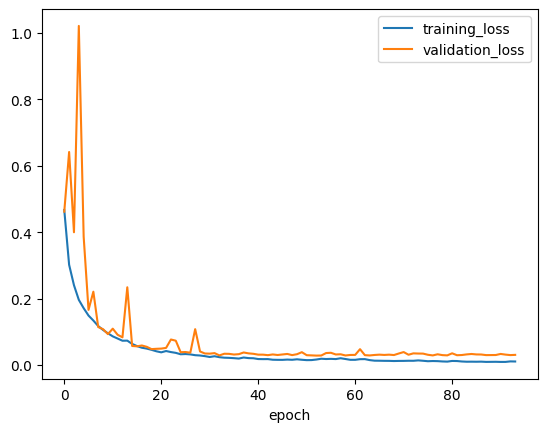

In [13]:
results[["training_loss", "validation_loss"]].plot()
plt.show()

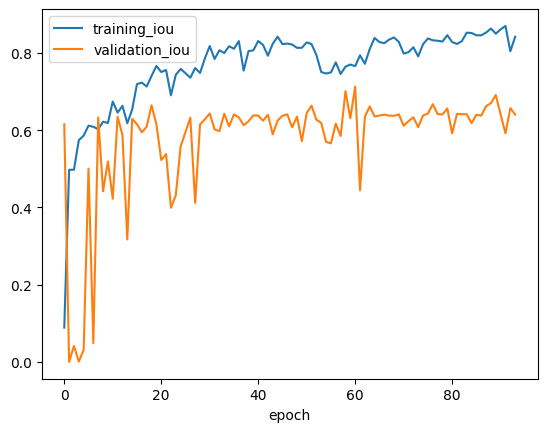

In [14]:
results[["training_iou", "validation_iou"]].plot()
plt.show()

In [15]:
max_val_iou = results["validation_iou"].max()
results[results["validation_iou"] == max_val_iou]

,training_loss,training_iou,validation_loss,validation_iou
epoch,,,,
60,0.015604,0.766098,0.030409,0.712968


In [16]:
PATH_60 = "/content/models/epoch_60.pt"

In [17]:
pd.set_option("max_colwidth", None)
df_test = pd.read_csv("test.csv")
df_test["tumor"] = df_test["mask_path"].apply(lambda m: diagnosis(m))
df_test

,image_path,mask_path,tumor
0,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_18.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_18_mask.tif,True
1,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_1.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_1_mask.tif,False
2,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_16.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_16_mask.tif,True
3,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_10.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_10_mask.tif,False
4,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_25.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_25_mask.tif,False
5,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_3.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_3_mask.tif,False
6,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_5.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_5_mask.tif,False
7,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_20.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_20_mask.tif,True
8,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_4.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_4_mask.tif,False
9,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_22.tif,/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_22_mask.tif,False


In [19]:
tumors = df_test[df_test["tumor"] == True]
no_tumors = df_test[df_test["tumor"] == False]

In [24]:
model = UNet(n_channels=3, n_classes=1)

checkpoint = torch.load(PATH_60, map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
model.eval()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, moment

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_18.tif


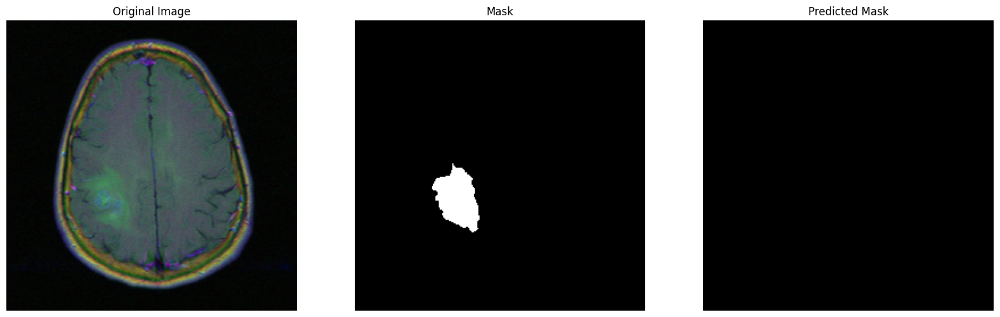

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_16.tif


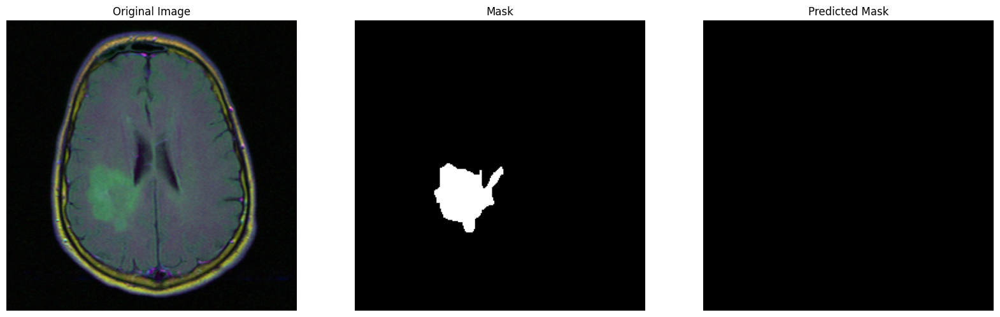

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_20.tif


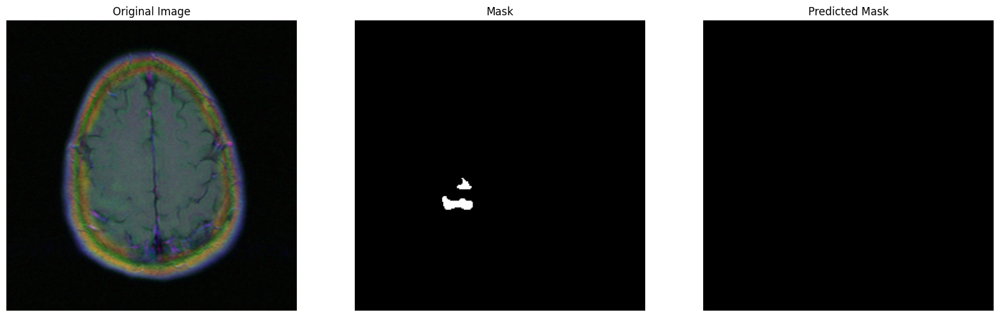

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_15.tif


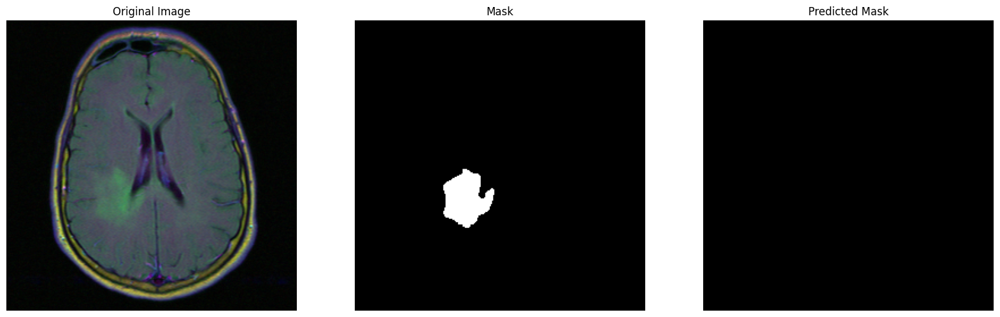

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_19.tif


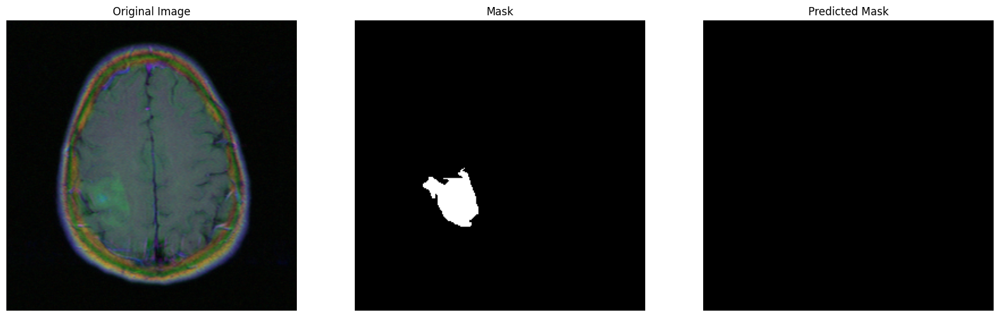

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_17.tif


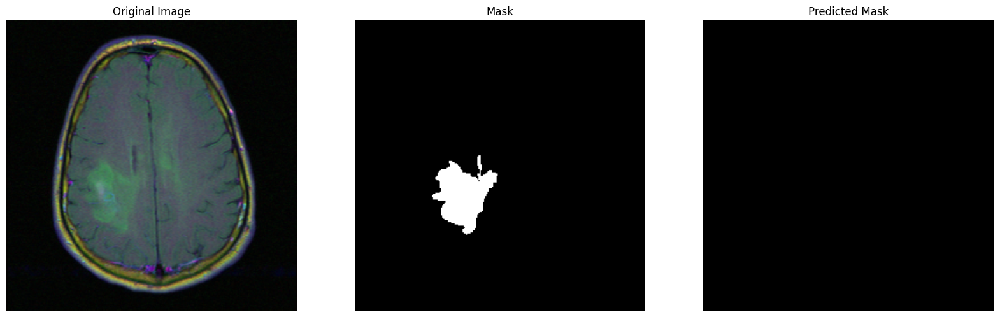

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_15.tif


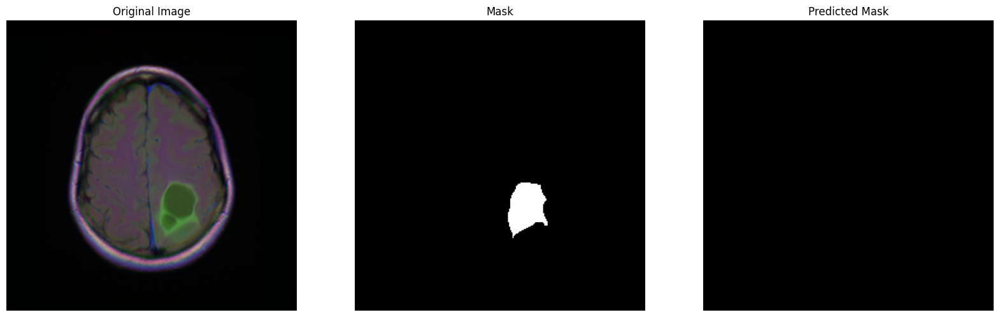

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_7.tif


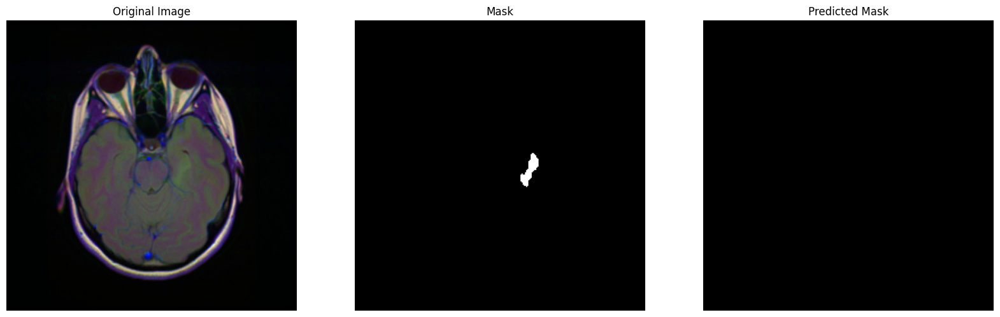

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_10.tif


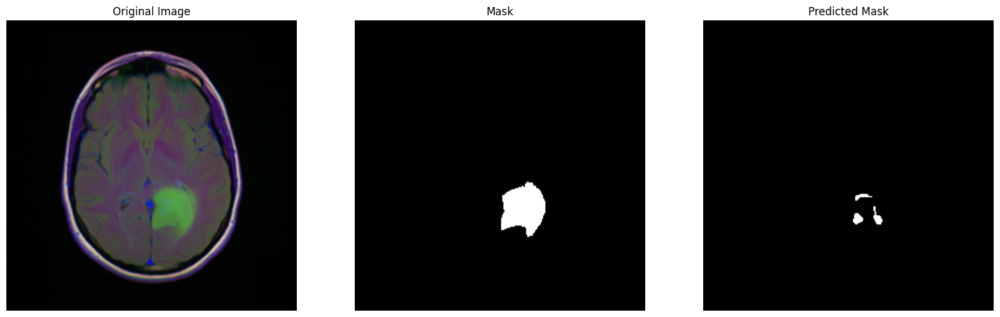

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_12.tif


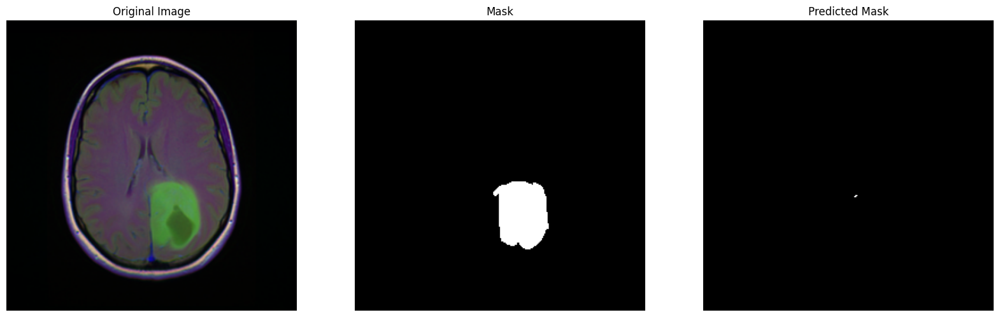

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_13.tif


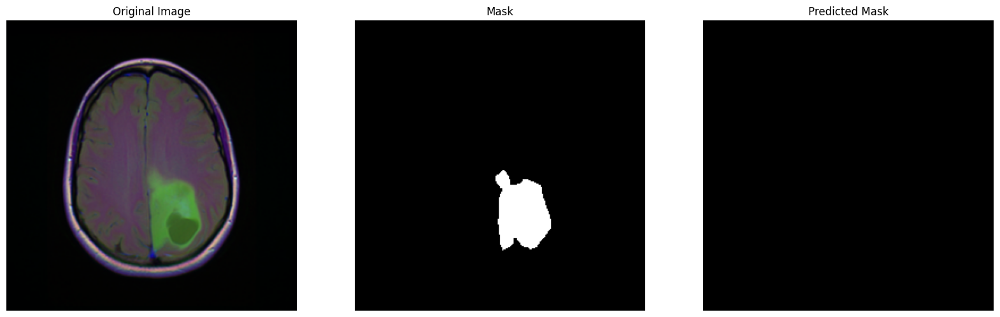

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_9.tif


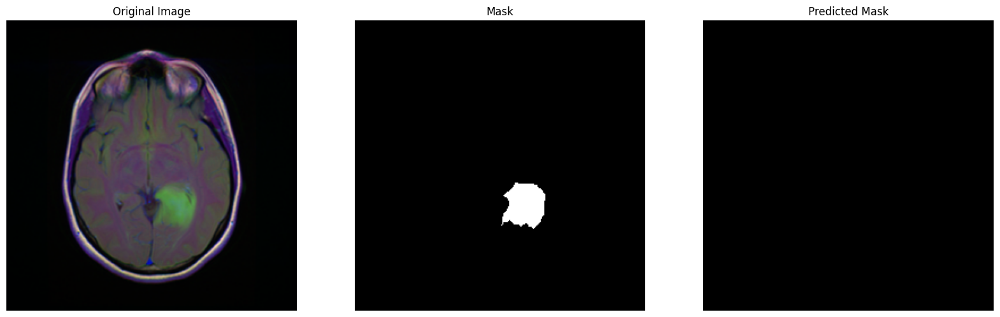

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_11.tif


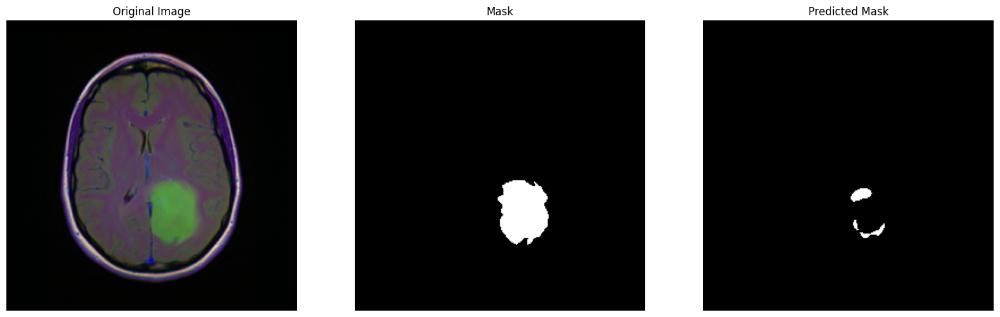

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_8.tif


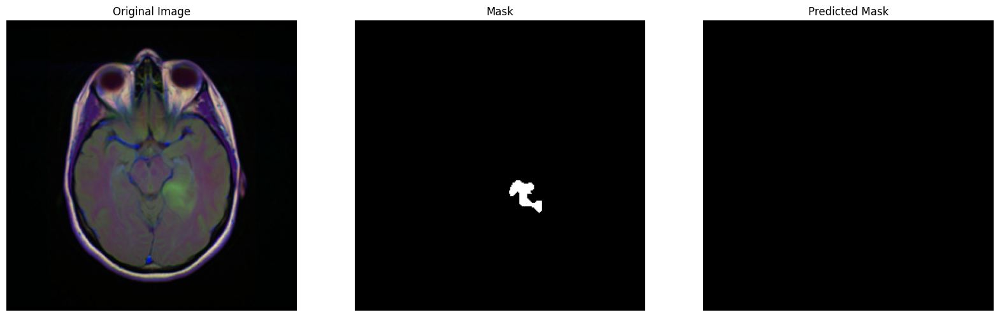

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_14.tif


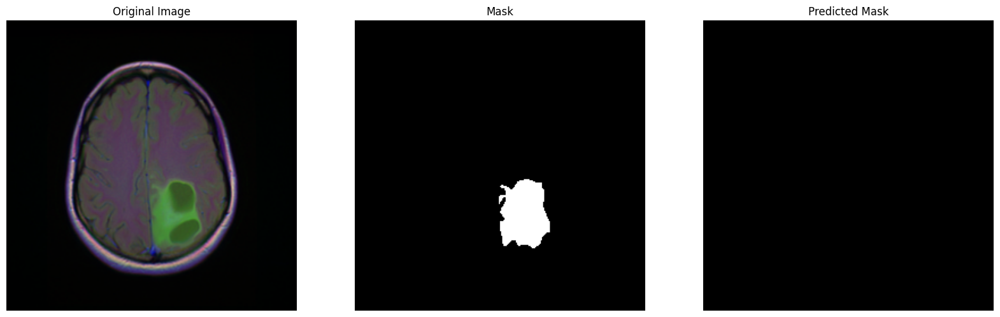

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_16.tif


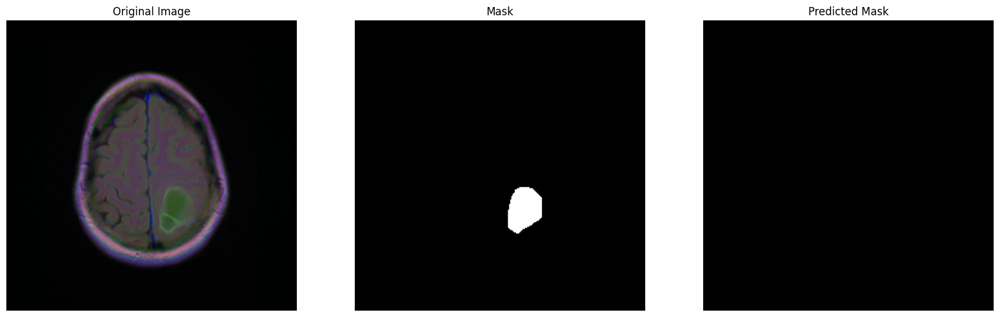

In [25]:
for image_path, mask_path in zip(tumors["image_path"], tumors["mask_path"]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_1.tif


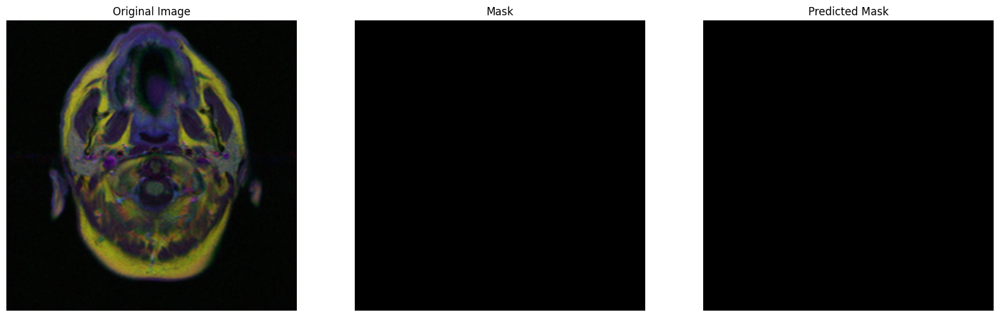

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_10.tif


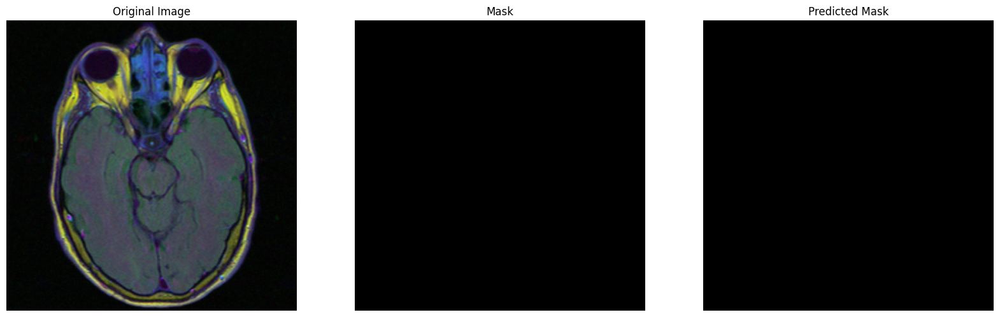

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_25.tif


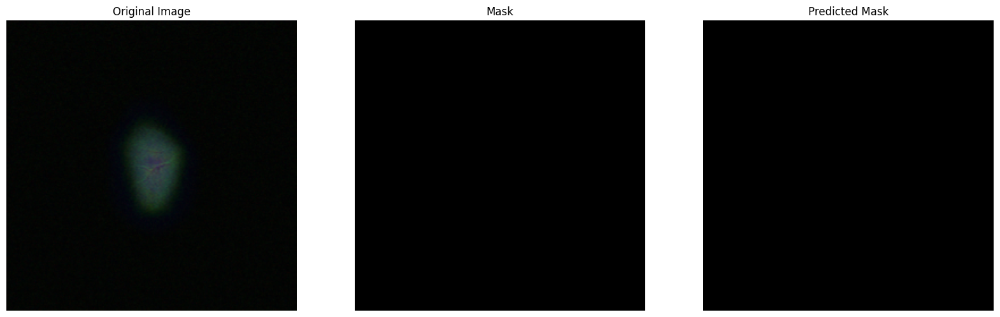

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_3.tif


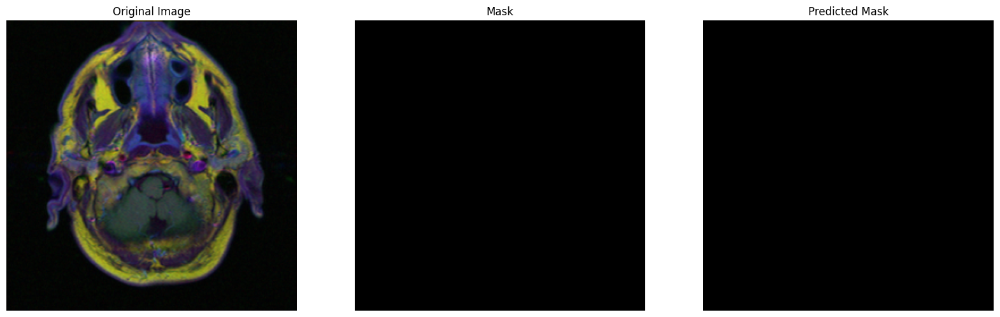

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_5.tif


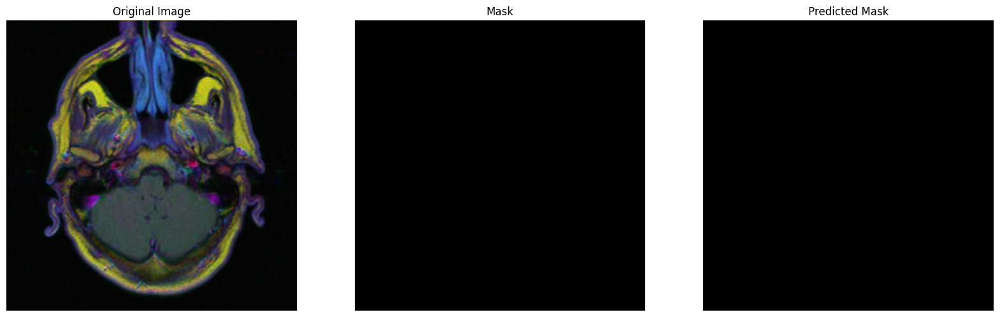

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_4.tif


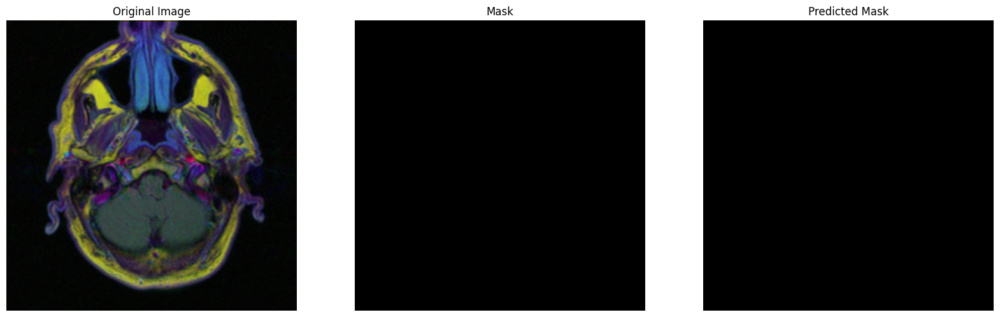

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_22.tif


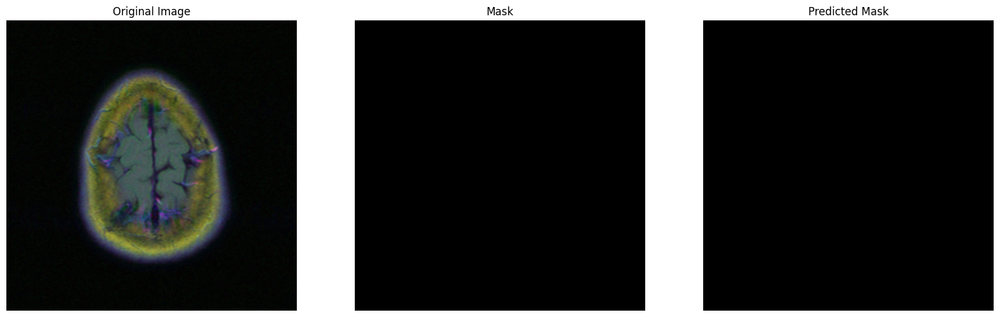

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_9.tif


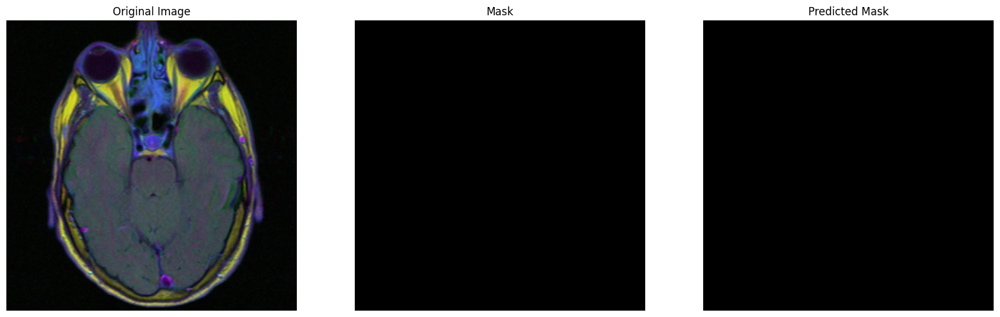

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_23.tif


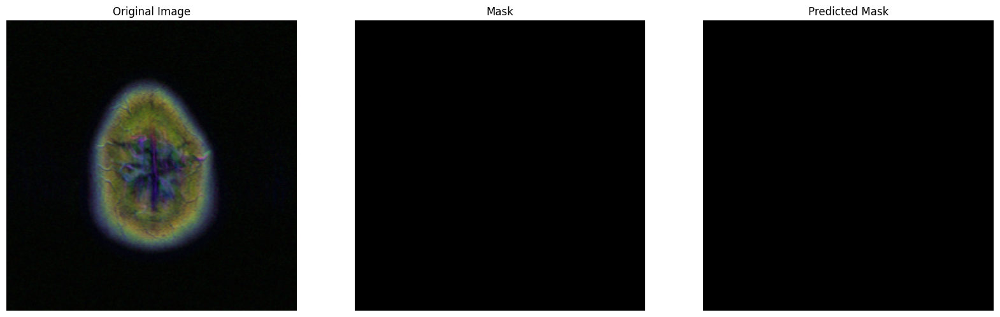

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_21.tif


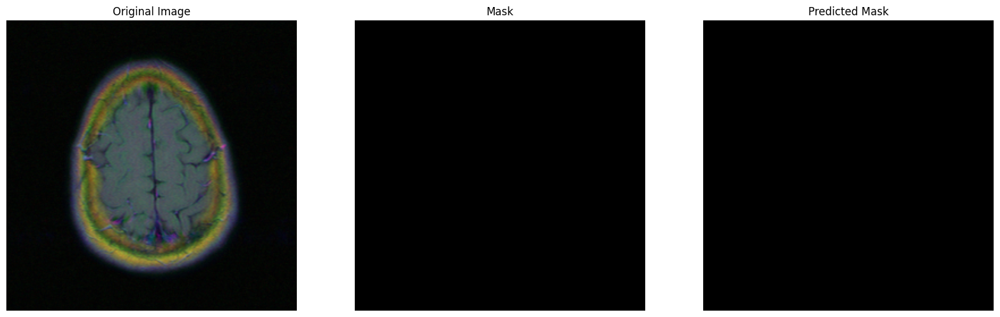

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_11.tif


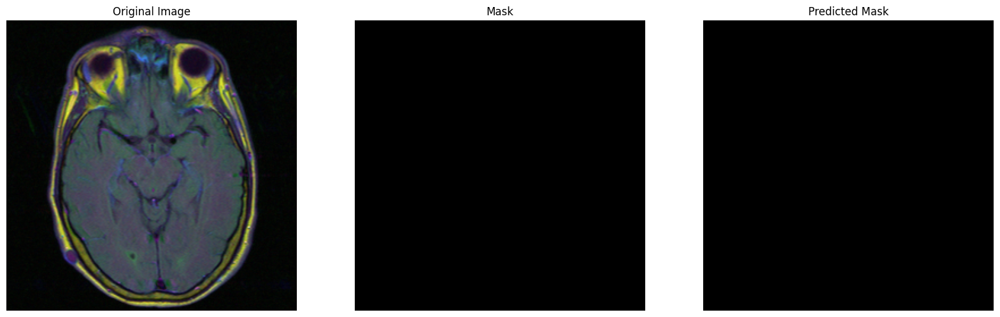

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_12.tif


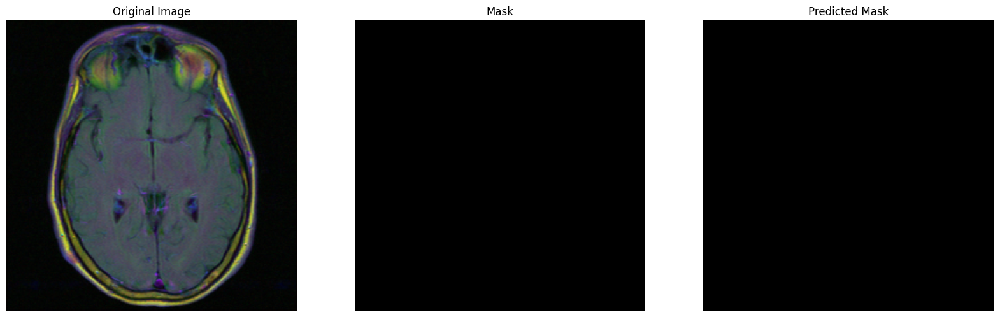

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_8.tif


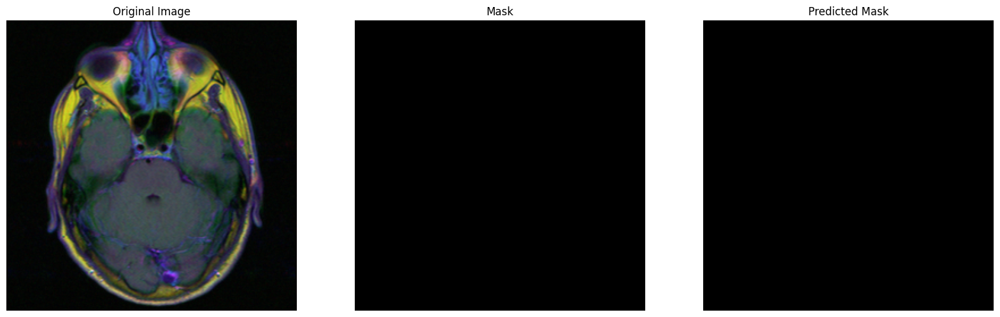

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_2.tif


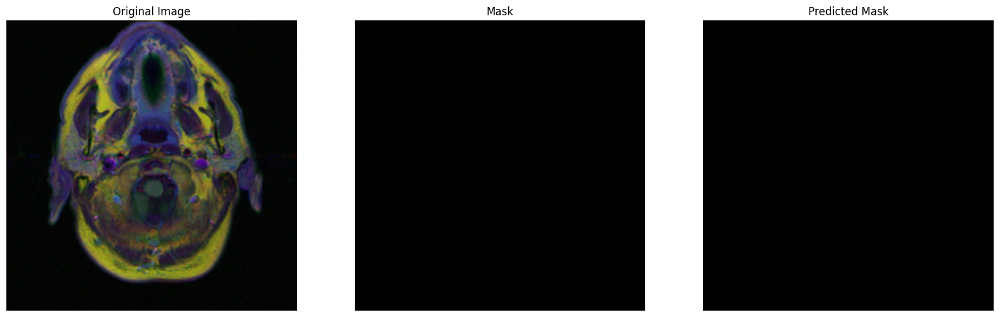

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_7.tif


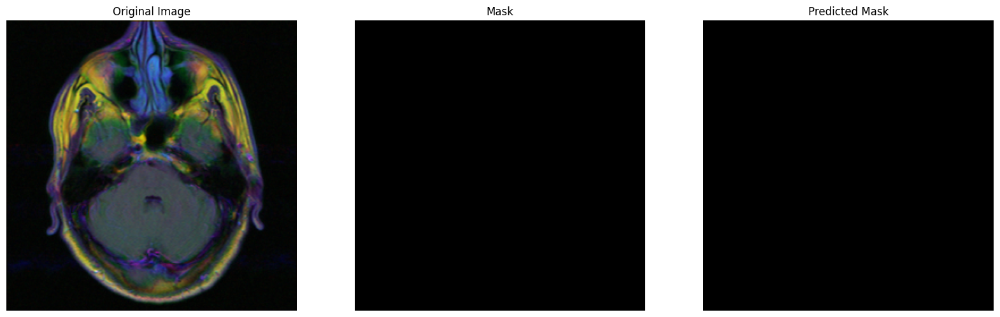

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_6.tif


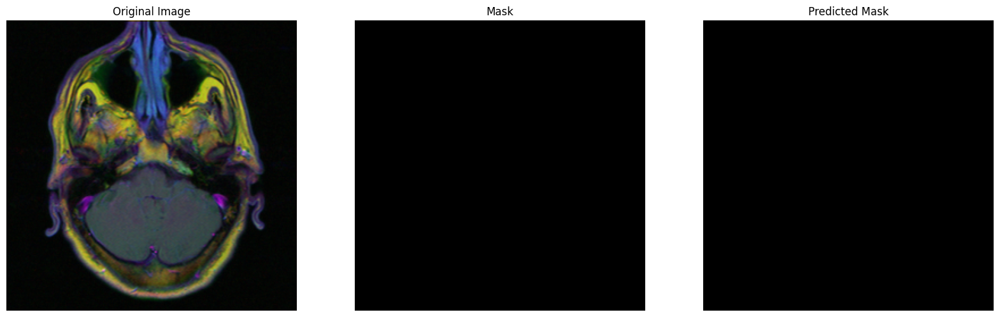

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_13.tif


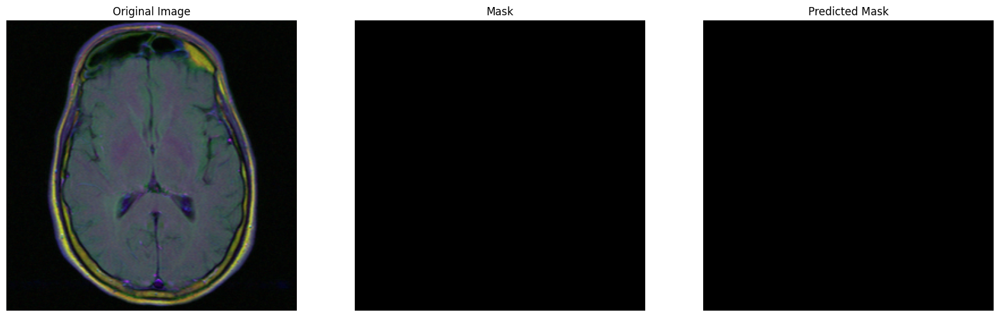

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_14.tif


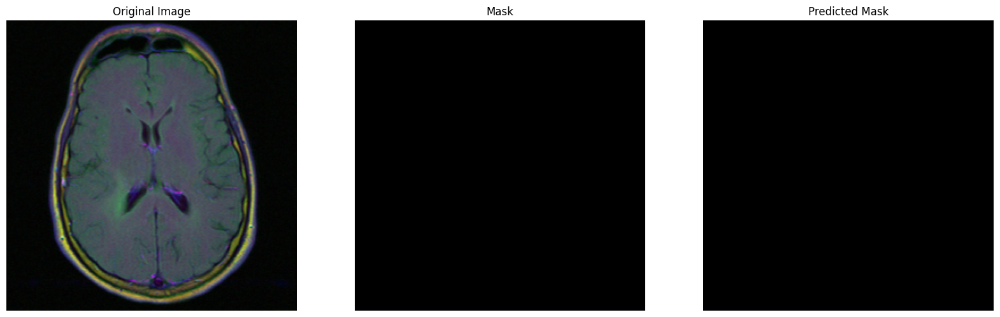

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_24.tif


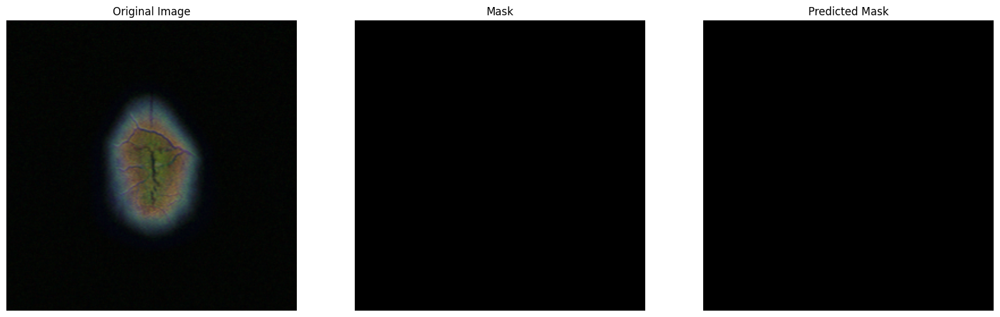

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_19.tif


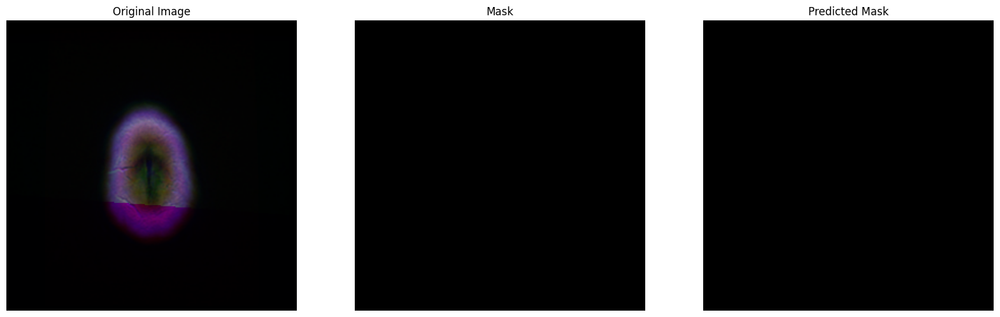

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_18.tif


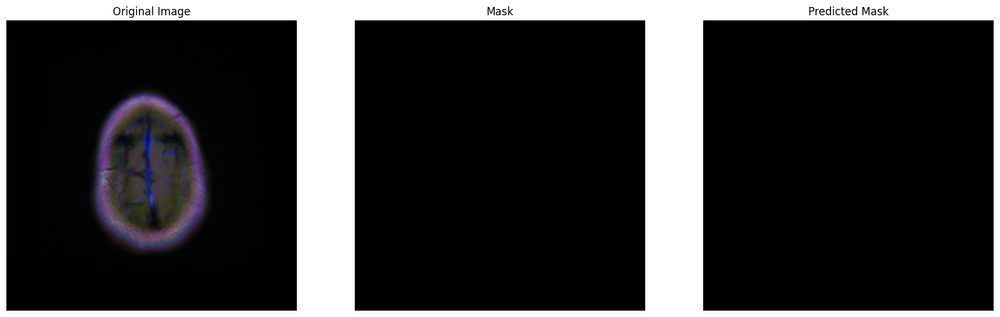

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_4.tif


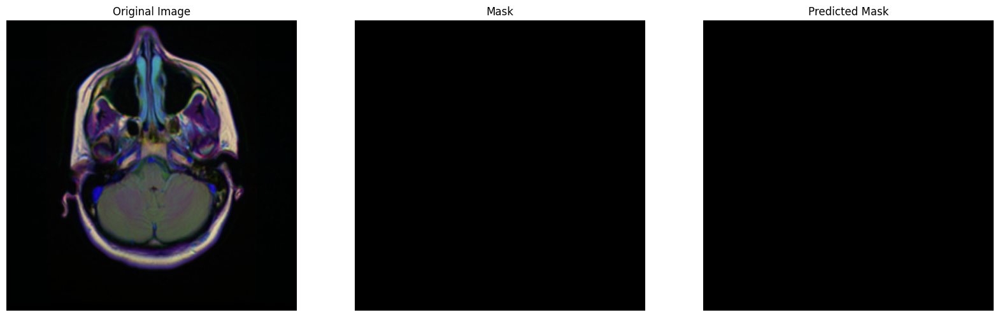

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_5.tif


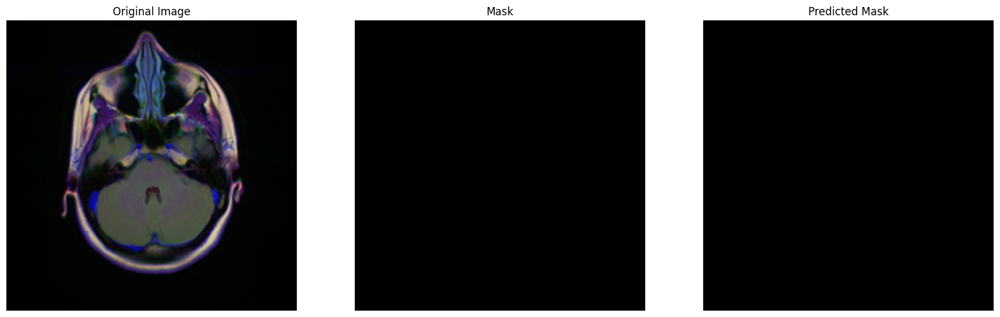

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_2.tif


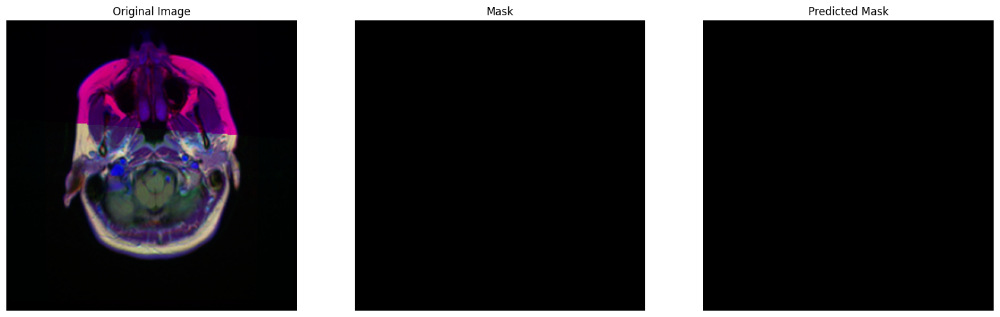

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_3.tif


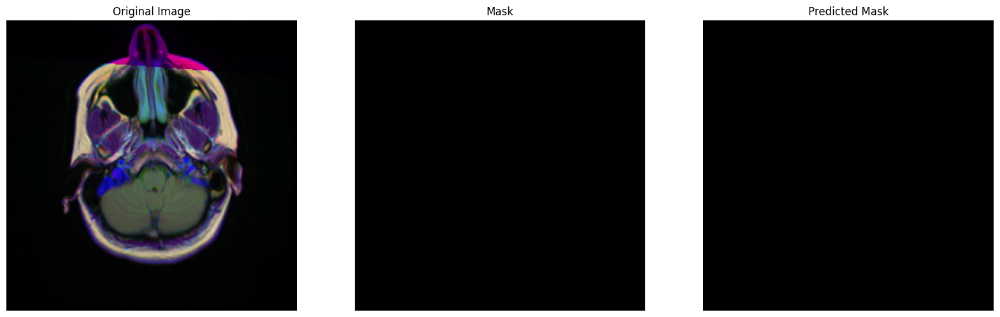

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_1.tif


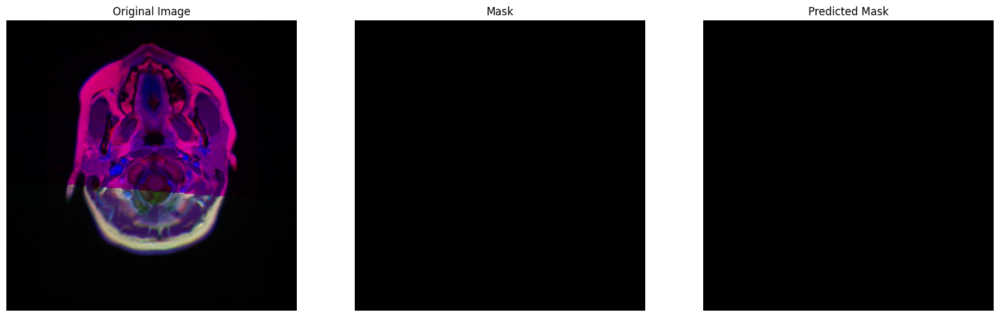

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_20.tif


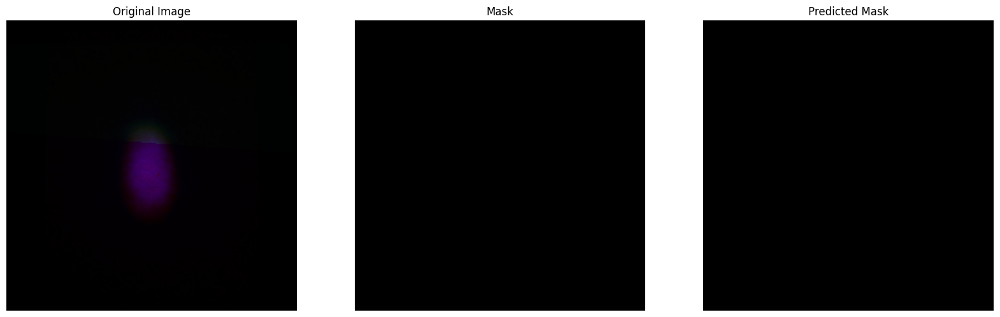

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_17.tif


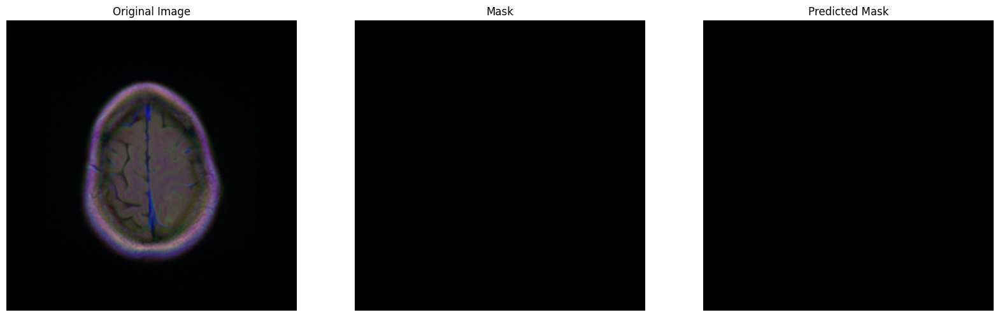

/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7686_19950629/TCGA_HT_7686_19950629_6.tif


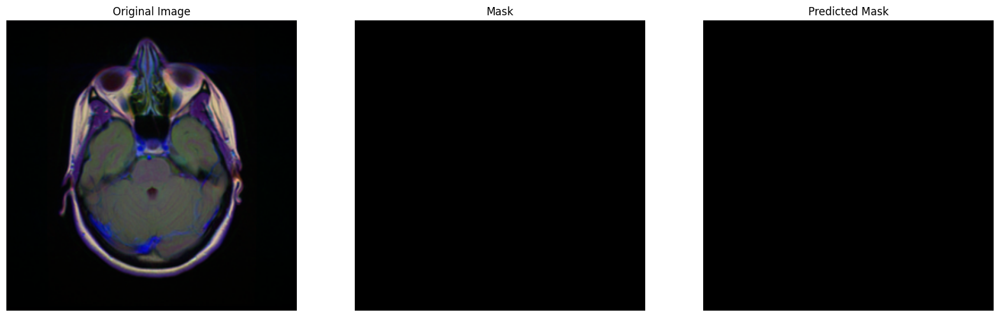

In [26]:
for image_path, mask_path in zip(no_tumors["image_path"], no_tumors["mask_path"]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)

# Test Model

In [27]:
import random

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

from constants import ImagesTransforms, ModelConstants
from unet import UNet
from utils import CustomDataset, calculate_iou

In [28]:
df_test = pd.read_csv("test.csv", usecols=["image_path", "mask_path"])

# create dataset
test_dataset = CustomDataset(
    df_test,
    image_transform=ImagesTransforms.IMAGE_TRANSFORM,
    mask_transform=ImagesTransforms.MASK_TRANSFORM,
)

# check if CUDA is available and use it, otherwise stick with CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(ModelConstants.N_CHANNELS, ModelConstants.N_CLASSES)
model.to(device)
criterion = nn.BCEWithLogitsLoss()
checkpoint = torch.load(
    PATH_60, map_location=torch.device("cpu")
)  # model was trained on GPU, but tested on CPU
model.load_state_dict(checkpoint["model_state_dict"])

test_loader = DataLoader(
    test_dataset,
    batch_size=ModelConstants.BATCH_SIZE,
    shuffle=False,
)
model.eval()
test_loss = 0
test_iou = 0
with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        test_loss += criterion(output, target).item()
        test_iou += calculate_iou(output, target).item()

print(
    f"Test Loss: {test_loss / len(test_loader)}, Test IoU: {test_iou / len(test_loader)}"
)

Test Loss: 0.028025683015584946, Test IoU: 0.6200204193592072
